# Notebook for the analysis of generator networks, generating graphs and figures

## Imports

In [1]:
%matplotlib inline
%load_ext tensorboard

import datetime
import matplotlib.pyplot as plt
import time
import tensorflow as tf
import numpy as np
import model_fcts as mod
import preprocessing_fcts as pp
import os
from importlib import reload
import pandas as pd
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
reload(mod)

## Load model

In [4]:
model_names = os.listdir('training_checkpoints')
for i, name in enumerate(model_names):
    print(i, name)

0 seg
1 gan_sem_map
2 pix_fm
3 pix_rgb
4 drib_fm
5 pix_grad
6 TEST
7 pix_rgb_grad
8 test_sem_map
9 drib
10 pix2pix
11 pix_grad_fm
12 gan_sem_map_grad
13 pix512
14 rgb_grad_fm


In [3]:
models = [{'name':model_names[5], 'gen_type':'Generator256', 'res':256, 'rgb':False, 'fm':False, 'deconv':True}]

In [5]:
models

[{'name': 'pix_grad',
  'gen_type': 'Generator256',
  'res': 256,
  'rgb': False,
  'fm': False,
  'deconv': True}]

In [6]:
def get_inp_channels(rgb):
    inp_channels = 1
    if rgb:
        inp_channels += 3
    return inp_channels


def load_gen(name, gen_type, res, rgb, fm, deconv):
    """
    Function that returns a generator from the 'training_checkpoints' checkpoints directory
    inputs : 
    - name : str, name of the generator
    - gen_type : string corresponding to a generator defined in 'model_fcts.py'
    - res : int, either 256 or 512 for an input DSM of either 256x256 or 512x512 pixels
    - rgb : bool, whether or not the rgb channels of the orthophotographs are included in the input. If False, only the DSM 
    - fm : bool, whether or not feature matching is used
    - deconv: bool, whether or not deconvolutions are used in the generator. If false, the alternative upsampling method is used
    """
    net_gen = getattr(mod, gen_type)
    inp_channels = get_inp_channels(rgb)  
    gen = net_gen(inp_channels, res, deconv=deconv)
    checkpoint = tf.train.Checkpoint(generator=gen)
    checkpoint.restore('training_checkpoints/' + name + '/ckpt-1').expect_partial()
    
    return gen

## Mean and std dev of RMSE

In [7]:
def mean_std_RMSE(mod_params):
    """
    Computes the RMSE. Predictions are generated 5 times and the mean is taken because there is some randomness in the prediction generation (partially because of the dropout layers)
    mod_params : dictionnary with parameters defining the model (name, res, rgb)
    returns the meand and std dev of the results for the RMSE computed 5 times. The set of predictions for the last iteration is given in the output as well to avoid having to compute them again 
    """
    raw_test_dataset, test_dataset =pp.load_dataset(mod_params['res'], mod_params['rgb'])
    print(mod_params['name'])
    RMSE_list = []
    for i in range(5):
        print(str(i+1) + '/5', end='\r')
        gen = load_gen(**mod_params)
        preds = gen.predict(test_dataset, verbose=0)
        RMSE = mod.test_RMSE(preds)
        RMSE_list.append(RMSE)
        
    return np.mean(RMSE_list), np.std(RMSE_list), preds

## Loading a model and generating the set of predictions for the test dataset

In [8]:
gen = load_gen(**models[0])
raw_test_dataset, test_dataset = pp.load_dataset(models[0]['res'],models[0]['rgb'])
preds = gen.predict(test_dataset)

1024/1024 [==============================] - 16s 14ms/step


In [9]:
print('RMSE = ' + str(mod.test_RMSE(preds)))
print('MAE = ' + str(mod.test_L1(preds)))

RMSE = 1.0928936967952199
MAE = 0.5958799070504028


## Representation of the gradient and normal losses

In [ ]:
dtm = [i[1] for i in test_dataset.take(40)][39][0]
pred_dtm = preds[39]


dx1 = tf.expand_dims(tf.expand_dims(tf.pad(dtm[:,:,0][1:,] - dtm[:,:,0][:-1,], [[0,1],[0,0]]), axis=0), axis=-1)
dy1 = tf.expand_dims(tf.expand_dims(tf.pad(dtm[:,:,0][:,1:] - dtm[:,:,0][:,:-1], [[0,0],[0,1]]), axis=0), axis=-1)

dx2 = tf.expand_dims(tf.expand_dims(tf.pad(pred_dtm[:,:,0][1:,] - pred_dtm[:,:,0][:-1,], [[0,1],[0,0]]), axis=0), axis=-1)
dy2 = tf.expand_dims(tf.expand_dims(tf.pad(pred_dtm[:,:,0][:,1:] - pred_dtm[:,:,0][:,:-1], [[0,0],[0,1]]), axis=0), axis=-1)

grad_im = tf.sqrt(tf.square(dy1 - dy2)+ tf.square(dx1 - dx2) + 1.0e-12)
num_im = dx1*dx2 + dy1*dy2 + 1
denum_im = tf.sqrt((tf.square(dx1) + tf.square(dy1) + 1)) * tf.sqrt((tf.square(dx2) + tf.square(dy2) + 1))

norm_im = num_im/denum_im

fig, axs = plt.subplots(1,2)
fig.set_figheight(4)
fig.set_figwidth(9)
ax = axs[0]
ax.title.set_text('Generated DTM')
im = ax.imshow(pred_dtm)
ax.axis('off')
ax = axs[1]
ax.title.set_text('Target DTM')
im = ax.imshow(dtm)
ax.axis('off')
#plt.savefig('ex_gen_dtm.png')

fig, axs = plt.subplots(1,3)
fig.set_figheight(4)
fig.set_figwidth(14)
ax = axs[0]
ax.title.set_text('Difference image')
im = ax.imshow(tf.abs(dtm - pred_dtm))
ax.axis('off')
ax = axs[1]
ax.title.set_text('Gradient image')
im = ax.imshow(grad_im[0])
ax.axis('off')
ax = axs[2]
ax.title.set_text('Normal image')
im = ax.imshow(np.minimum(1-norm_im[0], 0.002))
ax.axis('off')
plt.savefig('grad_norm_example.png')


## Tensorboard graphs

In [ ]:
%tensorboard --logdir /home/student/data/logs/gan --host 0.0.0.0

## Visualisation of DTM error per pixel location

In [10]:
raw_test_dataset, test_dataset = pp.load_dataset(models[0]['res'],models[0]['rgb'])
tbs_ds = raw_test_dataset.map(lambda x, y : (tf.math.reduce_max(x[:,:,0]), tf.math.reduce_min(x[:,:,0]))) #For each DSM, computes the highest and lowest point for normalization

In [11]:
tf_preds = tf.data.Dataset.from_tensor_slices(preds)
denorm_preds = tf.data.Dataset.zip((tf_preds, tbs_ds)).map(lambda x, y: pp.denormalize(x, y[0], y[1])) # "denormalize" predicted DTMs (which have values between -1 and 1)
error_locs_ds = tf.data.Dataset.zip((denorm_preds, raw_test_dataset)).map(lambda x, y: tf.abs(x[:,:,0] - y[1])) 
error_locs_rel = tf.data.Dataset.zip((denorm_preds, raw_test_dataset)).map(lambda x, y: x[:,:,0] - y[1])

Text(0.5, 1.0, 'Average error of the generated DTMs \n at each pixel location')

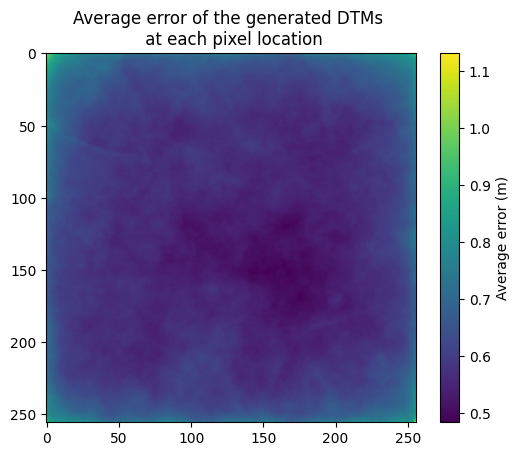

In [12]:
error_locs = error_locs_ds.reduce(np.float32(0), lambda x, y : x + y) #compute average error at every pixel coordinate
plt.imshow(error_locs/1024)
cbar = plt.colorbar()
cbar.ax.set_ylabel('Average error (m)')
plt.title('Average error of the generated DTMs \n at each pixel location')
#plt.savefig('error_loc_grad.png')

Text(0.5, 1.0, 'Average value of the predicted DTMs at each pixel coordinate \n (generator trained with modified loss function)')

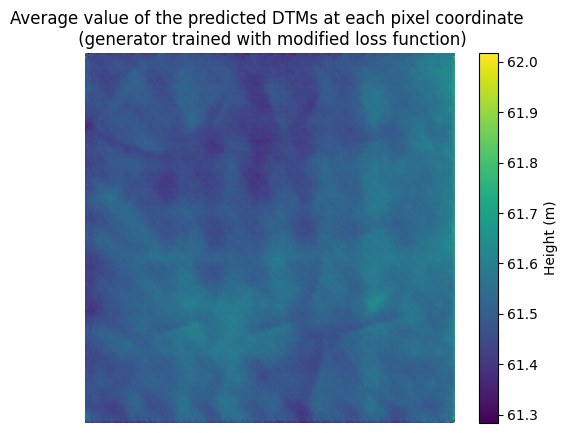

In [13]:
av_dp = denorm_preds.reduce(np.float32(0), lambda x, y : x + y)/1024
plt.imshow(av_dp)
cbar = plt.colorbar()
cbar.ax.set_ylabel('Height (m)')
plt.axis('off')
plt.title('Average value of the predicted DTMs at each pixel coordinate \n (generator trained with modified loss function)')
#plt.savefig('Av_pred_grad.png')

### Finding the artifacts in the predictions from the pix2pix network

In [ ]:
n = 0
point = []
for i in error_locs_ds.as_numpy_iterator():
    point.append(i[55, 195])
    n += 1
er_l = np.argsort(point)

In [ ]:
test_im = np.zeros((256,256))
n = 0
for i in error_locs_ds.as_numpy_iterator():
    if n not in spk2_list:
        #plt.figure()
        #plt.imshow(i)
        #plt.title(str(n))
        test_im += i
    n += 1
plt.figure()
plt.imshow(test_im/1024)
plt.colorbar()
cbar.ax.set_ylabel('Height (m)')
#plt.title('Contribution of the 24 images with the "square" artifact\n to the total average error per pixel\n coordinate in the generated DTMs')
plt.title('Average error per pixel coordinate in the generated DTMs\n without the images with the "square" artifact')
plt.tight_layout()
plt.savefig('Figures/error_locs_verif/spk2/sommme_no_spk.png')

In [ ]:
images = [tf.cast(i[:,:,1:], dtype='int32') for i in rgb_dataset.take(1024)]
dtms = [i[1][0] for i in test_dataset.take(1024)]
for i in spk2_list:
    fig, axs = plt.subplots(1,2)
    fig.set_figheight(4)
    fig.set_figwidth(9)
    ax = axs[0]
    ax.title.set_text('DTM ' + str(i))
    im = ax.imshow(dtms[i])
    ax=axs[1]
    ax.title.set_text('Generated DTM')
    im = ax.imshow(preds[i])
    plt.savefig('Figures/error_locs_verif/spk2/' + str(i) + '.png')

## DTM errors : images & histograms

In [14]:
rgb_dataset = pp.load_dataset(models[0]['res'],True)[0].map(lambda x, y:x)
images = [tf.cast(i[:,:,1:], 'int32') for i in rgb_dataset.take(100)]
dsms = [i[:,:,0] for i in rgb_dataset.take(100)]

Setting the colormap

In [15]:
from mpl_toolkits.axes_grid1 import AxesGrid
import matplotlib
def shiftedColorMap(cmap, start=0, midpoint=0.5, stop=1.0, name='shiftedcmap'):
    '''
    Credit : Paul H's answer on https://stackoverflow.com/questions/7404116/defining-the-midpoint-of-a-colormap-in-matplotlib
    
    Function to offset the "center" of a colormap. Useful for
    data with a negative min and positive max and you want the
    middle of the colormap's dynamic range to be at zero.

    Input
    -----
      cmap : The matplotlib colormap to be altered
      start : Offset from lowest point in the colormap's range.
          Defaults to 0.0 (no lower offset). Should be between
          0.0 and `midpoint`.
      midpoint : The new center of the colormap. Defaults to 
          0.5 (no shift). Should be between 0.0 and 1.0. In
          general, this should be  1 - vmax / (vmax + abs(vmin))
          For example if your data range from -15.0 to +5.0 and
          you want the center of the colormap at 0.0, `midpoint`
          should be set to  1 - 5/(5 + 15)) or 0.75
      stop : Offset from highest point in the colormap's range.
          Defaults to 1.0 (no upper offset). Should be between
          `midpoint` and 1.0.
    '''
    cdict = {
        'red': [],
        'green': [],
        'blue': [],
        'alpha': []
    }

    # regular index to compute the colors
    reg_index = np.linspace(start, stop, 257)

    # shifted index to match the data
    shift_index = np.hstack([
        np.linspace(0.0, midpoint, 128, endpoint=False), 
        np.linspace(midpoint, 1.0, 129, endpoint=True)
    ])

    for ri, si in zip(reg_index, shift_index):
        r, g, b, a = cmap(ri)

        cdict['red'].append((si, r, r))
        cdict['green'].append((si, g, g))
        cdict['blue'].append((si, b, b))
        cdict['alpha'].append((si, a, a))

    newcmap = matplotlib.colors.LinearSegmentedColormap(name, cdict)
    plt.register_cmap(cmap=newcmap)

    return newcmap

def shift_cmap_midpoint(tensor, i):
    cmap = matplotlib.cm.coolwarm
    if tf.math.reduce_min(tensor) < 0.0:
        midpoint = (-1)* tf.math.reduce_min(tensor) / (tf.math.reduce_max(tensor)  - tf.math.reduce_min(tensor))
        shifted_cmap = shiftedColorMap(cmap, midpoint=midpoint, name=datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + str(i))
    else:
        shifted_cmap = cmap
    return shifted_cmap
    

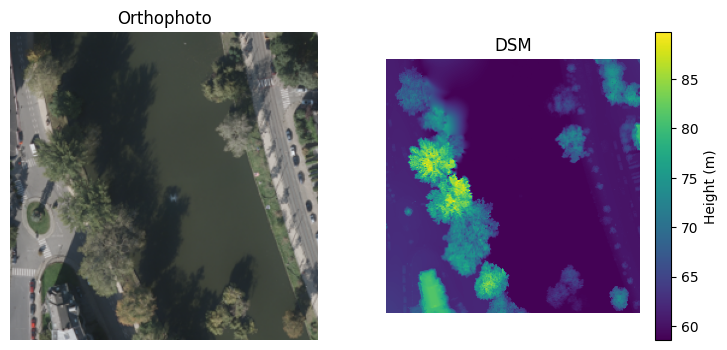

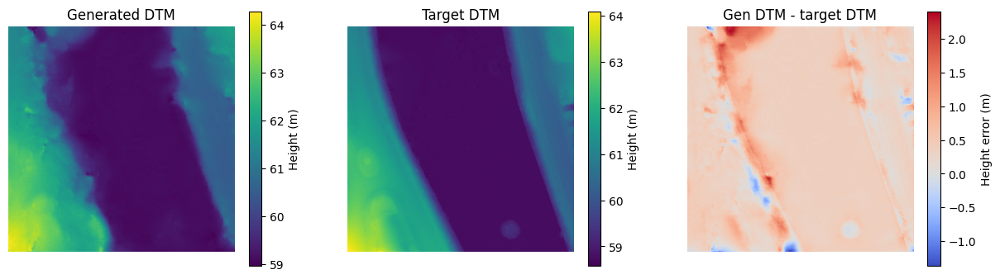

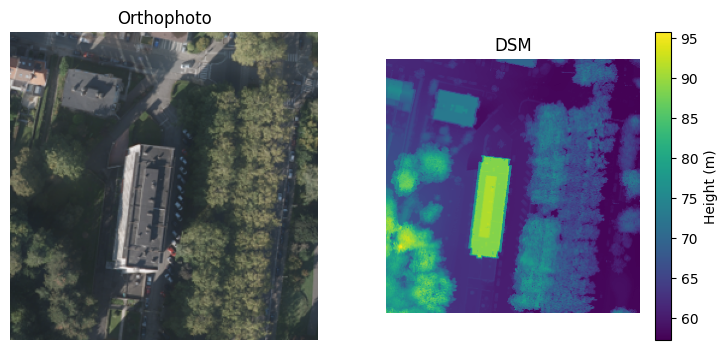

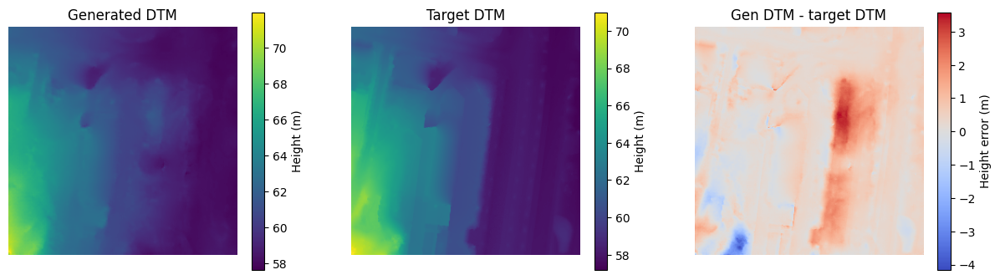

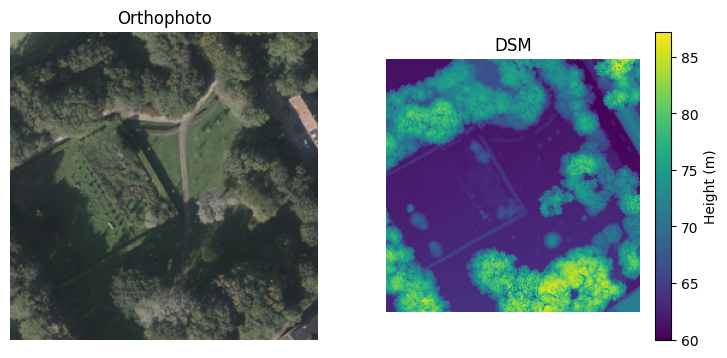

...

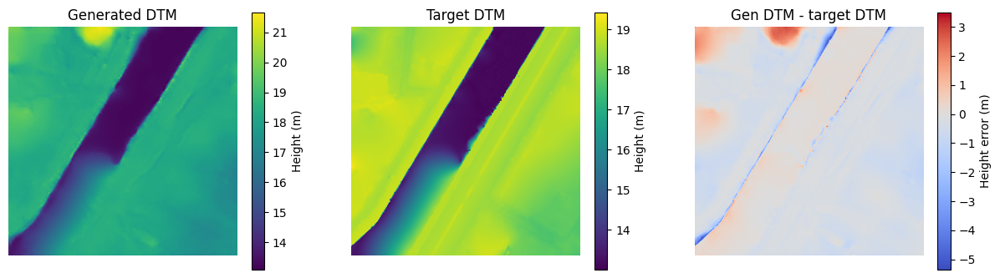

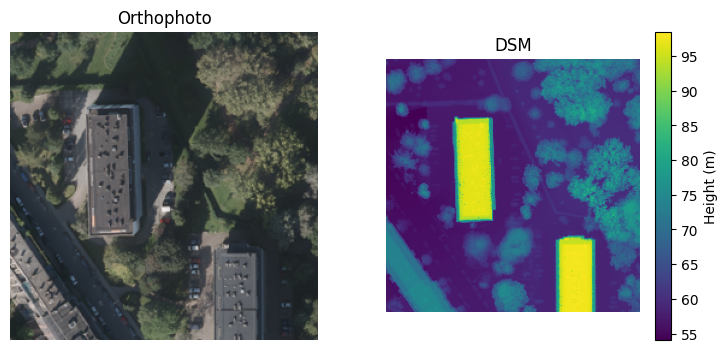

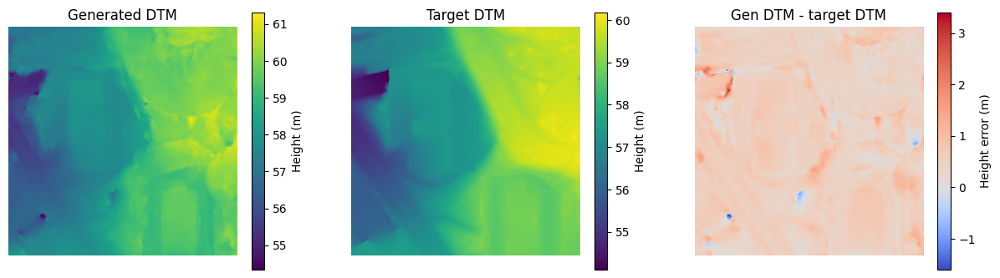

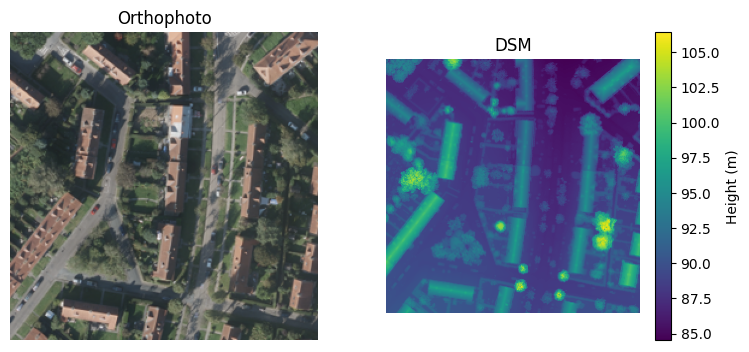

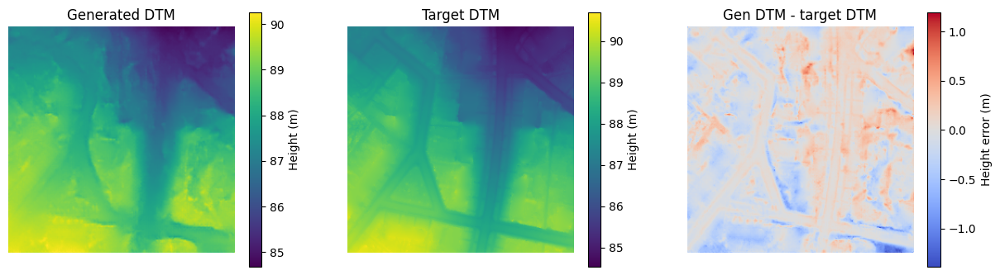

In [16]:
preds_ex = [i for i in denorm_preds.take(100)]
dtms_ex = [i[1] for i in raw_test_dataset.take(100)]
err_ex = [i for i in error_locs_rel.take(100)]

path = 'Figures/Gan stats images/pix256_2/dtms/'

for i in range(80):
    if i in [1, 3, 5, 13, 19, 23, 27, 34, 39]:
        fig, axs = plt.subplots(1,2)
        fig.set_figheight(4)
        fig.set_figwidth(9)
        ax = axs[0]
        ax.title.set_text('Orthophoto')
        im = ax.imshow(images[i])
        ax.axis('off')
        ax = axs[1]
        ax.title.set_text('DSM')
        im = ax.imshow(dsms[i])
        cbar = fig.colorbar(im, ax=ax)
        cbar.ax.set_ylabel('Height (m)')
        ax.axis('off')
        #plt.savefig(path + 'dsm_' + str(i))
        
        
        fig, axs = plt.subplots(1,3)
        fig.set_figheight(4)
        fig.set_figwidth(15)
        ax = axs[0]
        ax.title.set_text('Generated DTM')
        im = ax.imshow(preds_ex[i])
        ax.axis('off')
        cbar = fig.colorbar(im, ax=ax)
        cbar.ax.set_ylabel('Height (m)')
        ax = axs[1]
        ax.title.set_text('Target DTM')
        im = ax.imshow(dtms_ex[i])
        cbar = fig.colorbar(im, ax=ax)
        cbar.ax.set_ylabel('Height (m)')
        ax.axis('off')
        ax = axs[2]
        ax.title.set_text('Gen DTM - target DTM')
        im = ax.imshow(err_ex[i], cmap=shift_cmap_midpoint(err_ex[i], i))
        cbar = fig.colorbar(im, ax=ax)
        cbar.ax.set_ylabel('Height error (m)')
        ax.axis('off')
        #plt.savefig(path + 'dtm_' + str(i))

In [ ]:
preds_ex = [i for i in denorm_preds.take(100)]
dtms_ex = [i[1] for i in raw_test_dataset.take(100)]
err_ex = [i for i in error_locs_rel.take(100)]

preds2_ex = [i for i in denorm_preds2.take(40)]
err_ex2 = [i for i in error_locs_rel2.take(40)]

for i in [1, 3, 5, 13, 19, 23, 27, 34, 39]:
    fig, axs = plt.subplots(1,3)
    fig.set_figheight(4)
    fig.set_figwidth(15)
    ax = axs[0]
    ax.title.set_text('Generated DTM \n with original loss')
    ax.axis('off')
    im = ax.imshow(preds2_ex[i])

    ax = axs[1]
    ax.title.set_text('Generated DTM \n with modified loss')
    im = ax.imshow(preds_ex[i])
    ax.axis('off')
    
    ax = axs[2]
    ax.title.set_text('Target DTM')
    im = ax.imshow(dtms_ex[i])

    ax.axis('off')
    #plt.savefig('Figures/Gan stats images/grad_loss/dtms/grad_dtm.png')

    
    fig, axs = plt.subplots(1,2)
    fig.set_figheight(5)
    fig.set_figwidth(10)
    ax = axs[0]
    ax.title.set_text('Difference with target DTM')
    ax.axis('off')
    im = ax.imshow(err_ex2[i], cmap=shift_cmap_midpoint(err_ex2[i], str(i)))
    fig.set_figheight(5)
    cbar = fig.colorbar(im, ax=ax)
    cbar.ax.set_ylabel('Height error (m)')

    ax = axs[1]
    ax.title.set_text('Difference with target DTM')
    fig.set_figheight(5)
    im = ax.imshow(err_ex[i], cmap=shift_cmap_midpoint(err_ex[i], str(i)+'1'))
    fig.set_figheight(4)
    cbar = fig.colorbar(im, ax=ax)
    cbar.ax.set_ylabel('Height error (m)')
    ax.axis('off')
    #plt.savefig('Figures/Gan stats images/grad_loss/dtms/grad_dif_dtm.png')


In [17]:
def plot_hist(err_ds, hist_range, title, use_class=False, coef=100):
    # computes and plots the distribution of the errors in the predicted heights
    # the 'coef' parameter is just used for the second histogram, to have all the percentages add up to 'coef', which should be the percentage of errors lower than 1m
    if hist_range == 1:
        bins = [0.0,1.0,2.0,100.0]
        ticks = ['<1m', '[1m-2m]', '>2m']
    elif hist_range == 2:
        bins = [0.0,0.2,0.4,0.6,0.8,1]
        ticks = ['0-0.2m','0.2-0.4m','0.4-0.6m','0.6-0.8m','0.8-1m']

    hist_tot = np.zeros(len(bins)-1)
    
    if not use_class:
        for i in err_ds.map(lambda x: tf.reshape(x, [x.shape[0]*x.shape[1]])).as_numpy_iterator():
            hist = np.histogram(i, bins=bins)
            hist_tot += hist[0]
    else:
        for i in err_ds.map(lambda x, y: (tf.reshape(x, [x.shape[0]*x.shape[1]]), tf.reshape(y, [y.shape[0]*y.shape[1]]))).as_numpy_iterator():
            selected_err = i[0][np.nonzero(i[1])]
            hist = np.histogram(selected_err, bins=bins)
            hist_tot += hist[0]
        
            
    hist_tot = coef*hist_tot/np.sum(hist_tot)
    
    bar = plt.bar(list(range(len(bins) - 1)), hist_tot, width=0.7, tick_label=ticks)
    ax = plt.gca()
    ax.get_yaxis().set_visible(False)
    for rect in bar:
        height = rect.get_height()
        plt.text(rect.get_x() + rect.get_width() / 2.0, height, f'{height:.0f}' + '%', ha='center', va='bottom')
        plt.title(title)

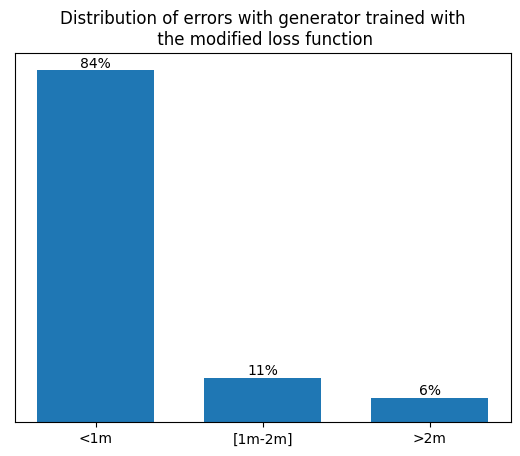

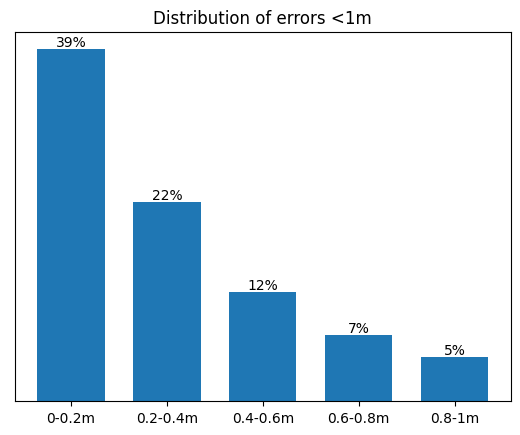

In [18]:
plot_hist(error_locs_ds, 1, 'Distribution of errors with generator trained with\n the modified loss function')
#plt.savefig('gan_rgb_grad_fm_err_barplot.png')
plt.figure()
plot_hist(error_locs_ds, 2, 'Distribution of errors <1m', coef=85)
#plt.savefig('gan_rgb_grad_fm_err_barplot2.png')

## Errors for ground and object points

#### Object points

In [20]:
obj_mask = raw_test_dataset.map(lambda x,y: tf.cast(tf.math.greater (x[:,:,0]-y, tf.constant(0.01)), dtype='float32'))
ground_mask = raw_test_dataset.map(lambda x,y: tf.cast(tf.math.greater (y-x[:,:,0], tf.constant(-0.01)), dtype='float32'))

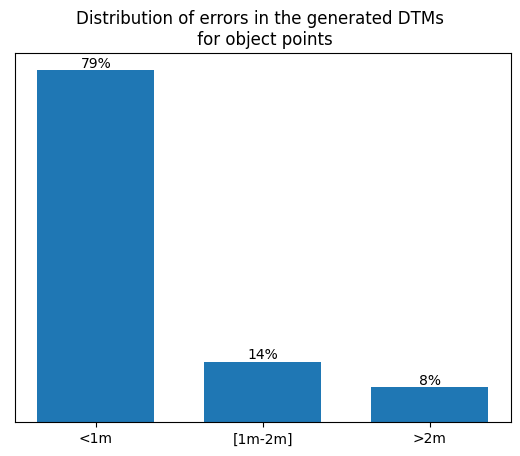

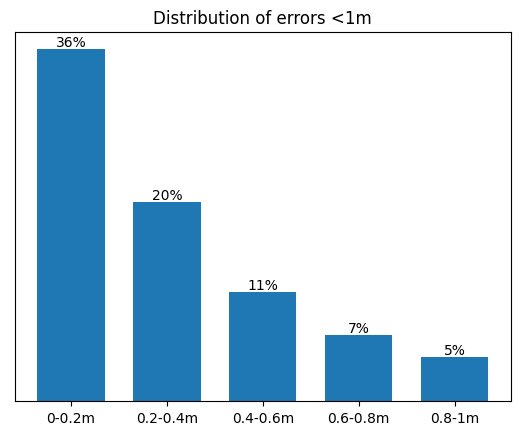

In [23]:
obj_err = tf.data.Dataset.zip((error_locs_ds, obj_mask))
n = 0
plot_hist(obj_err, 1, 'Distribution of errors in the generated DTMs \n for object points', use_class=True)
#plt.savefig('pix_err_op.png')
plt.figure()
plot_hist(error_locs_ds, 2, 'Distribution of errors <1m', coef=79)
#plt.savefig('pix_err_op2.png')

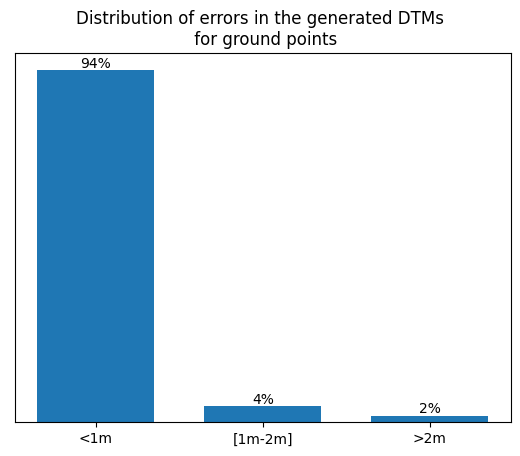

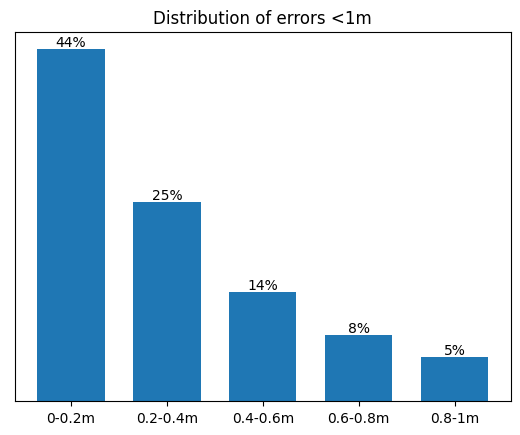

In [22]:
ground_err = tf.data.Dataset.zip((error_locs_ds, ground_mask))
n = 0
plot_hist(ground_err, 1, 'Distribution of errors in the generated DTMs \n for ground points', use_class=True)
#plt.savefig('rgb_grad_fm_err_gp.png')
plt.figure()
plot_hist(error_locs_ds, 2, 'Distribution of errors <1m', coef=96)
#plt.savefig('rgb_grad_fm_err_gp2.png')

## Results with validation dataset

In [29]:
raw_val_dataset = tf.data.Dataset.load('tf_dataset/val_dataset_256')
val_dataset = pp.normalize_tf_dataset(raw_val_dataset, rgb=False)
val_dataset = val_dataset.batch(1)
preds = gen.predict(val_dataset)

516/516 [==============================] - 7s 14ms/step


In [30]:
val_dsm = val_dataset.map(lambda x,y: (tf.expand_dims(x[0][:,:,0], axis=-1), y)).batch(1)

In [32]:
test_ds = raw_val_dataset.map(lambda x,y: (tf.expand_dims(x[:,:,0], axis=-1), y))
tbs_ds = test_ds.map(lambda x, y : (tf.math.reduce_max(x[:,:,0]), tf.math.reduce_min(x[:,:,0])))

### RMSE

In [33]:
tbs = [] #list containing the value of highest and lowest pixel in each DSM (for normalization)
res = preds[0].shape[1] #256 or 512
test_ds = raw_val_dataset.map(lambda x,y: (tf.expand_dims(x[:,:,0], axis=-1), y))
tbs_ds = test_ds.map(lambda x, y : (tf.math.reduce_max(x[:,:,0]), tf.math.reduce_min(x[:,:,0])))

for i in tbs_ds.as_numpy_iterator(): #fill the tbs list
    tbs.append(i)

dtms = test_ds.map(lambda x, y: y)
ssum = 0
ssum_L1 = 0
n = res**2

N = str(preds.shape[0])
i = 0
for j in dtms.as_numpy_iterator():
    pred = preds[i]
    pred = pp.denormalize(pred, tbs[i][0], tbs[i][1])
    dif = np.sum((pred[:,:,0] - j)**2)
    dif_L1 = np.sum(tf.abs((pred[:,:,0] - j)))
    ssum += dif
    ssum_L1 += dif_L1
    i += 1
    #print(str(i) + '/' + N, end='\r')
#print(i)
print('RMSE = ' + str(np.sqrt(ssum/(i*n))))
print('MAE = ' + str(ssum_L1/(i*n)))

RMSE = 1.1234505178150354
MAE = 0.5825121759530879


### With semantic maps

In [34]:
import seg_models

In [35]:
name = 'seg_model'
inputs = tf.keras.layers.Input(shape=[512,512, 4])
net = seg_models.PixUnet(inputs, relu=True, activ='sigmoid')
segmentor = mod.Generator(inputs=inputs, outputs=net)
checkpoint = tf.train.Checkpoint(model=segmentor)
checkpoint.restore('training_checkpoints/seg/' + name + '/ckpt-1')

In [36]:
raw_test_dataset, test_dataset = pp.load_dataset(512, True)
raw_val_dataset = tf.data.Dataset.load('tf_dataset/val_dataset_512')
val_dataset = pp.normalize_tf_dataset(raw_val_dataset, True)
val_dataset = val_dataset.batch(1)

In [37]:
val_masks = segmentor.predict(val_dataset)

129/129 [==============================] - 4s 22ms/step


In [38]:
def divide_tensor(image):
    return tf.convert_to_tensor([image[0:256,0:256], image[0:256,256:512], image[256:512,0:256], image[256:512,256:512]])

def divide_one_array(image):
    return np.array([image[0:256,0:256], image[0:256,256:512], image[256:512,0:256], image[256:512,256:512]])

def mask_ds_gen(mod):
    if mod == 0:
        for mask in train_masks256:
            yield mask
    if mod == 1:
        for mask in test_masks256:
            yield mask
    if mod == 2:
        for mask in val_masks256:
            yield mask

divide_array = np.vectorize(divide_one_array)

In [39]:
test_masks = (val_masks>=0.5).astype('int32')
test_masks256 = np.array(list(map(divide_one_array,test_masks))).reshape(516,256,256,1) #we have semantic maps for 129 images of 512x512 pixels --> convert to 516 images of 256x256 pixels
test_masks_ds = tf.data.Dataset.from_generator(mask_ds_gen, args=(1,), output_signature=(tf.TensorSpec(shape=(256,256,1), dtype=tf.float32))) # converted to tf dataset

test_input = raw_val_dataset.map(lambda x,y:tf.reshape(x[:,:,0], [512,512,1])) #dataset with just the DSMs

test_dtm = raw_val_dataset.map(lambda x,y:y) #dataset with just the dtms
    
test_input = test_input.map(lambda x: divide_tensor(x)) # dsms also divided in 4 to get images of 256x256 pixels
test_dtm = test_dtm.map(lambda x: divide_tensor(x))

test_input = test_input.flat_map(tf.data.Dataset.from_tensor_slices) 
test_dtm = test_dtm.flat_map(tf.data.Dataset.from_tensor_slices)

raw_test_dataset256 = tf.data.Dataset.zip((test_input,test_dtm)).map(lambda x,y: (x, tf.reshape(y,[256,256]))) #dsm and target dtm put back together in a dataset
test_dataset256 = pp.normalize_tf_dataset(raw_test_dataset256, False) #normalization

test_dataset256 = tf.data.Dataset.zip((test_dataset256, test_masks_ds)) #dataset zipped together with the semantic maps dataset
test_dataset256 = test_dataset256.map(lambda x,y: (tf.concat((x[0],y),axis=-1), x[1])).batch(1)

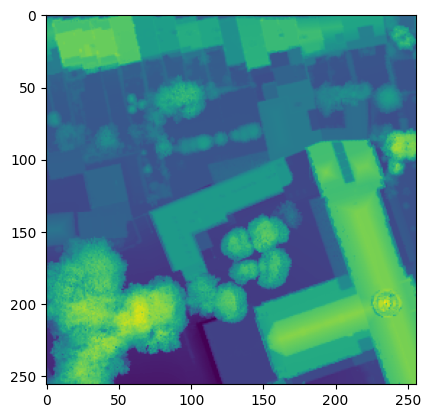

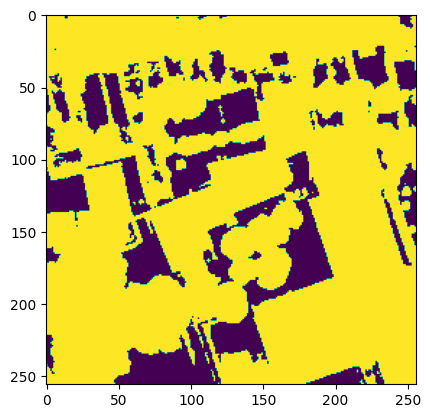

In [40]:
for i in test_dataset256.take(1):
    plt.imshow(i[0][0][:,:,0])
    plt.figure()
    plt.imshow(i[0][0][:,:,1])

In [41]:
gen = mod.Generator256(2, 256)
checkpoint = tf.train.Checkpoint(generator=gen)
checkpoint.restore('training_checkpoints/' + 'gan_sem_map' + '/ckpt-1').expect_partial()

In [42]:
preds = gen.predict(test_dataset256)

516/516 [==============================] - 8s 14ms/step


In [43]:
res = preds[0].shape[1] #256 or 512
    
ssum = 0
ssum_L1 = 0
n = res**2
N = str(preds.shape[0])

tbs = [] 
tbs_ds = raw_test_dataset256.map(lambda x,y : ((tf.math.reduce_max(x[:,:,0]), tf.math.reduce_min(x[:,:,0]))))
for i in tbs_ds.as_numpy_iterator(): #fill the tbs list
    tbs.append(i)
    
i = 0

for j in test_dtm.as_numpy_iterator():
    pred = preds[i]
    pred = pp.denormalize(pred, tbs[i][0], tbs[i][1])
    dif = np.sum((pred[:,:,0] - j)**2)
    dif_L1 = np.sum(tf.abs((pred[:,:,0] - j)))
    ssum += dif
    ssum_L1 += dif_L1
    i += 1

print(np.sqrt(ssum/(i*n)))
print(ssum_L1/(i*n))

1.0385348974690625
0.5001994901618292


## Comparison with dtms obtained with IDW interpolation

### Loading the images and conversion to tensorflow dataset

In [44]:
from PIL import Image

In [45]:
from osgeo import gdal

In [46]:
idw_dtms = []
for i in range(129):
    dtm = gdal.Open('interp_dsms/idw/a' + str(i) + '.tif')
    dtm = np.array(dtm.GetRasterBand(1).ReadAsArray())
    idw_dtms.append(dtm)
idw_dtms = np.array(idw_dtms)


In [47]:
test_dtm = raw_val_dataset.map(lambda x,y:y)
res = 512
    
ssum = 0
ssum_L1 = 0
n = res**2
N = 129
i = 0
for j in test_dtm.as_numpy_iterator():
    dif = np.sum((idw_dtms[i] - j)**2)
    dif_L1 = np.sum(tf.abs((idw_dtms[i] - j)))
    ssum += dif
    ssum_L1 += dif_L1
    i += 1

print(np.sqrt(ssum/(i*n)))
print(ssum_L1/(i*n))

2.2465366707175214
0.6974722760361295


In [48]:
idw_dtms_tf = tf.data.Dataset.from_tensor_slices(idw_dtms)

idw_dtms_tf256 = idw_dtms_tf.map(lambda x: divide_tensor(x)) # dsms also divided in 4 to get images of 256x256 pixels
test_dtm256 = test_dtm.map(lambda x: divide_tensor(x))
im = raw_val_dataset.map(lambda x,y:tf.cast(x[:,:,1:], dtype='int32'))
im256 = im.map(lambda x: divide_tensor(x))

idw_dtms_tf256 = idw_dtms_tf256.flat_map(tf.data.Dataset.from_tensor_slices) 
test_dtm256 = test_dtm256.flat_map(tf.data.Dataset.from_tensor_slices)

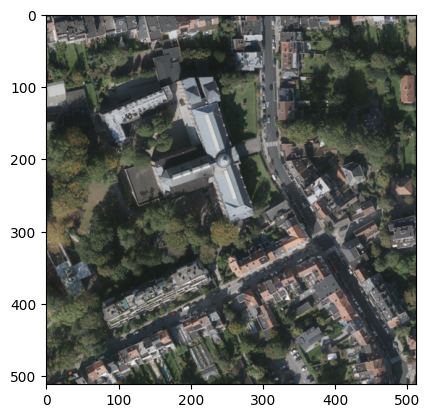

In [49]:
for i in raw_val_dataset.map(lambda x,y:tf.cast(x[:,:,1:], dtype='int32')).take(1):
    plt.imshow(i)

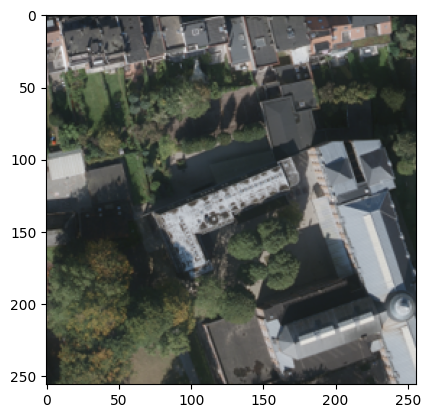

In [50]:
im = raw_val_dataset.map(lambda x,y:tf.cast(x[:,:,1:], dtype='int32'))
im256 = im.map(lambda x: divide_tensor(x))
for i in im256.flat_map(tf.data.Dataset.from_tensor_slices).take(1):
    plt.imshow(i)

<ipython-input-51-5415c7c6a845>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1,4)


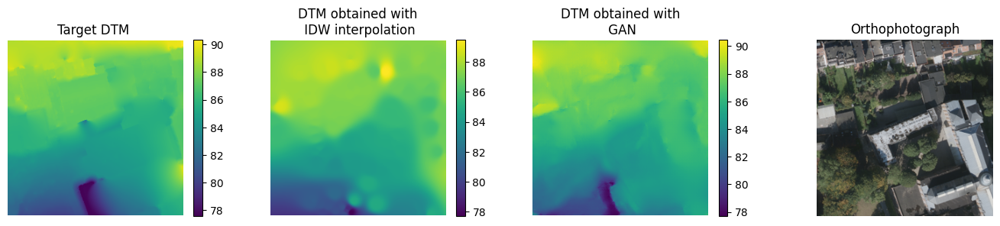

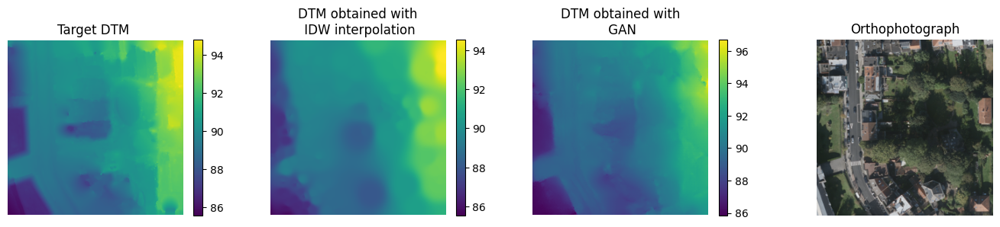

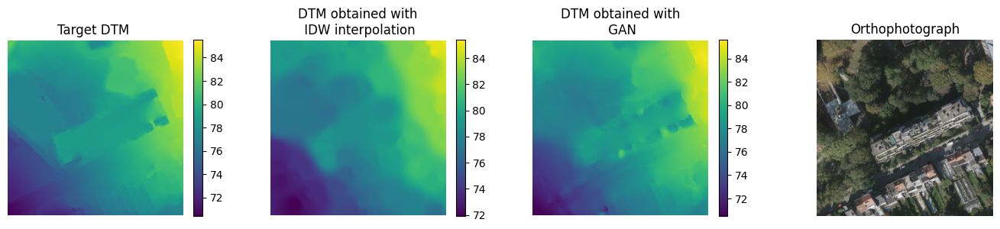

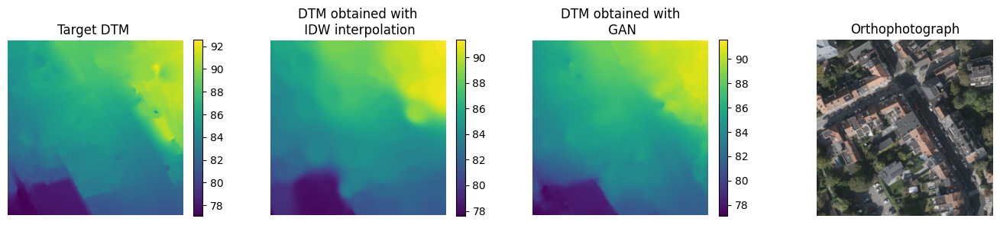

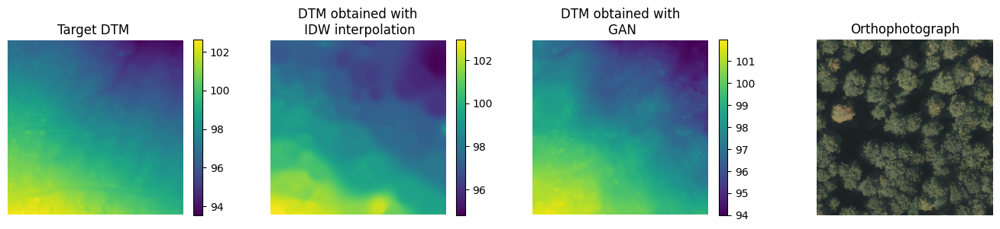

...

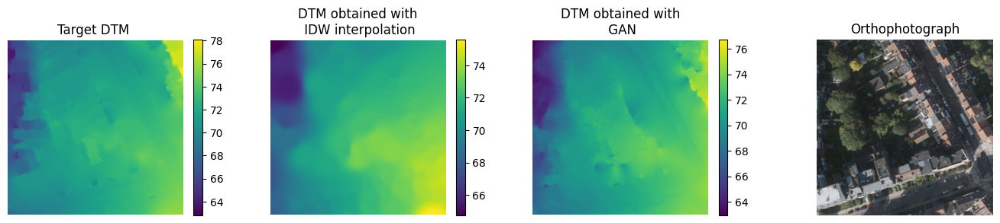

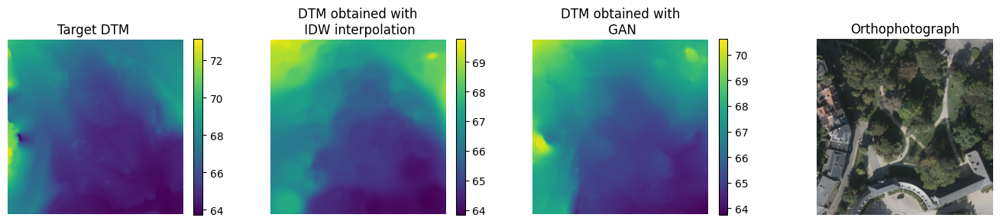

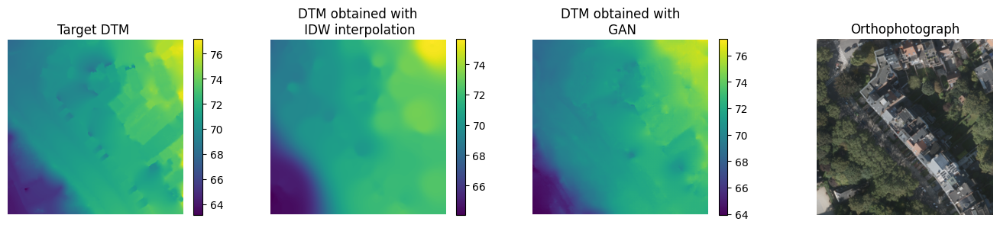

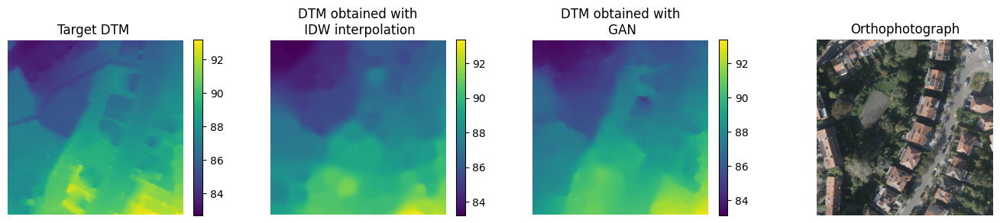

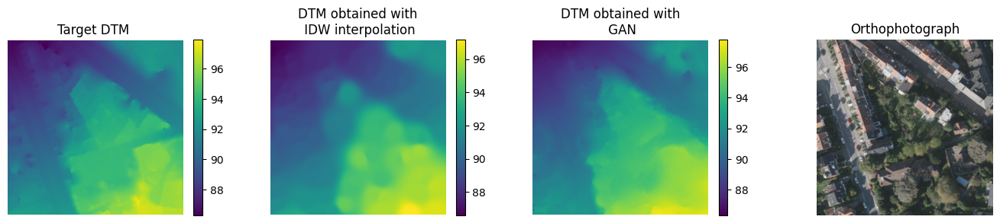

In [51]:
i = 0
idw_dtms256 = [i for i in idw_dtms_tf256.take(30)]
im = raw_val_dataset.map(lambda x,y:tf.cast(x[:,:,1:], dtype='int32'))
im256 = im.map(lambda x: divide_tensor(x))
im256 = [i for i in im256.flat_map(tf.data.Dataset.from_tensor_slices).take(30)]

for t in test_dtm256.take(30):
    fig, axs = plt.subplots(1,4)
    fig.set_figheight(4)
    fig.set_figwidth(17)
    ax = axs[0]
    ax.title.set_text('Target DTM ')
    ax.axis('off')
    im = ax.imshow(t)
    fig.set_figheight(3)
    cbar = fig.colorbar(im, ax=ax)
    
    fig.set_figheight(4)
    ax = axs[1]
    ax.title.set_text('DTM obtained with\n IDW interpolation')
    im = ax.imshow(idw_dtms256[i])
    ax.axis('off')
    fig.set_figheight(3)
    cbar = fig.colorbar(im, ax=ax)
    
    fig.set_figheight(4)
    ax = axs[2]
    ax.title.set_text('DTM obtained with\n GAN')
    im = ax.imshow(pp.denormalize(preds[i], tbs[i][0], tbs[i][1]))
    ax.axis('off')
    fig.set_figheight(3)
    cbar = fig.colorbar(im, ax=ax)
    
    fig.set_figheight(4)
    ax = axs[3]
    ax.title.set_text('Orthophotograph')
    im = ax.imshow(im256[i])
    fig.set_figheight(3)
    ax.axis('off')

    i += 1
    #plt.savefig('Figures/Gan stats images/grad_loss/dtms/grad_dtm.png')


In [ ]:
plt.imshow(preds[0])